In [2]:
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import random
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import json
import os

In [3]:
SPY = yf.download("SPY", start="2015-01-01", end="2025-09-01", auto_adjust=False)['Adj Close']

[*********************100%***********************]  1 of 1 completed


Futures Rollover and date adjustments (commodities follow SPY dates)

In [4]:
def continuous_contract_from_volume(df: pd.DataFrame) -> pd.DataFrame:
    df['date'] = pd.to_datetime(df['ts_event']).dt.date
    df_filtered = df[~df['symbol'].str.contains('-')].copy()
    df_sorted = df_filtered.sort_values(by=['date', 'volume'], ascending=[True, False])
    continuous_df = df_sorted.groupby('date').first().reset_index()
    columns_to_keep = ['date', 'symbol', 'open', 'high', 'low', 'close', 'volume']
    return continuous_df[columns_to_keep]

def futures_close(df, symbol):
    df = df.copy()
    df['date'] = pd.to_datetime(df['date'])
    df.set_index('date', inplace=True)
    return df[['close']].rename(columns={'close': f'{symbol}'})


with open("config.json", "r") as f:
    config = json.load(f)

base_path = config["base_path"]
files = config["files"]

data = {
    ticker: pd.read_csv(os.path.join(base_path, filename))
    for ticker, filename in files.items()
}

GC_raw = data["GC"]
CL_raw = data["CL"]
ZW_raw = data["ZW"]
GF_raw = data["GF"]
ZF_raw = data["ZF"]

GC = continuous_contract_from_volume(GC_raw)
CL = continuous_contract_from_volume(CL_raw)
ZW = continuous_contract_from_volume(ZW_raw)
GF = continuous_contract_from_volume(GF_raw)
ZF = continuous_contract_from_volume(ZF_raw)

In [5]:
GC_close = futures_close(GC, 'GC')
CL_close = futures_close(CL, 'CL')
ZW_close = futures_close(ZW, 'ZW')
GF_close = futures_close(GF, 'GF')
ZF_close = futures_close(ZF, 'ZF')

In [6]:
portfolio_df = SPY \
    .join(GC_close, how='left') \
    .join(CL_close, how='left') \
    .join(ZW_close, how='left') \
    .join(GF_close, how='left') \
    .join(ZF_close, how='left')

In [7]:
portfolio_df

,SPY,GC,CL,ZW,GF,ZF
Date,,,,,,
2015-01-02,171.568008,1189.8,52.81,581.25,221.525,119.132812
2015-01-05,168.469559,1203.2,50.08,588.25,223.900,119.312500
2015-01-06,166.882812,1216.3,47.95,592.00,221.425,119.773438
2015-01-07,168.962341,1212.5,48.57,579.00,220.900,119.734375
2015-01-08,171.960556,1208.2,49.33,567.50,216.550,119.726562
...,...,...,...,...,...,...
2025-08-25,642.469971,3399.8,64.71,529.75,362.425,108.906250
2025-08-26,645.159973,3440.7,63.42,531.75,364.875,109.085938
2025-08-27,646.630005,3451.0,63.80,524.75,364.650,109.460938


In [8]:
portfolio_df.ffill(inplace=True)

In [9]:
print(portfolio_df.isna().sum())

SPY    0
GC     0
CL     0
ZW     0
GF     0
ZF     0
dtype: int64


In [10]:
portfolio_df.to_csv('portfolio_df.csv')

Analysis and Graphs

In [11]:
def plot_price(df, title):
    fig = px.line(title=title)
    
    for i in df.columns:
        fig.add_scatter(x=df.index, y=df[i], name=i)
    
    fig.update_traces(line_width=3)
    fig.update_layout({'plot_bgcolor': "white"})
    fig.show()

def standardized_price(df):
    standardized_prices_df = df.copy()
    for i in df:
          standardized_prices_df[i] = df[i]/df[i].iloc[0]
    return standardized_prices_df

In [12]:
daily_returns_df = portfolio_df.pct_change() * 100
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df

,SPY,GC,CL,ZW,GF,ZF
Date,,,,,,
2015-01-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-01-05,-1.805960,1.126240,-5.169475,1.204301,1.072114,0.150830
2015-01-06,-0.941859,1.088763,-4.253195,0.637484,-1.105404,0.386328
2015-01-07,1.246101,-0.312423,1.293014,-2.195946,-0.237101,-0.032614
2015-01-08,1.774487,-0.354639,1.564752,-1.986183,-1.969217,-0.006525
...,...,...,...,...,...,...
2025-08-25,-0.440103,-0.509189,1.474047,0.426540,-0.082707,-0.114646
2025-08-26,0.418697,1.203012,-1.993510,0.377537,0.676002,0.164993
2025-08-27,0.227855,0.299358,0.599180,-1.316408,-0.061665,0.343766


In [13]:
standardized_price_df = standardized_price(portfolio_df)
standardized_price_df

,SPY,GC,CL,ZW,GF,ZF
Date,,,,,,
2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-01-05,0.981940,1.011262,0.948305,1.012043,1.010721,1.001508
2015-01-06,0.972692,1.022273,0.907972,1.018495,0.999549,1.005377
2015-01-07,0.984813,1.019079,0.919712,0.996129,0.997179,1.005050
2015-01-08,1.002288,1.015465,0.934103,0.976344,0.977542,1.004984
...,...,...,...,...,...,...
2025-08-25,3.744696,2.857455,1.225336,0.911398,1.636046,0.914158
2025-08-26,3.760375,2.891831,1.200909,0.914839,1.647105,0.915667
2025-08-27,3.768943,2.900487,1.208105,0.902796,1.646090,0.918814


In [14]:
plot_price(standardized_price_df, 'Standardized Closing Prices [$]')

Correlation Matrix

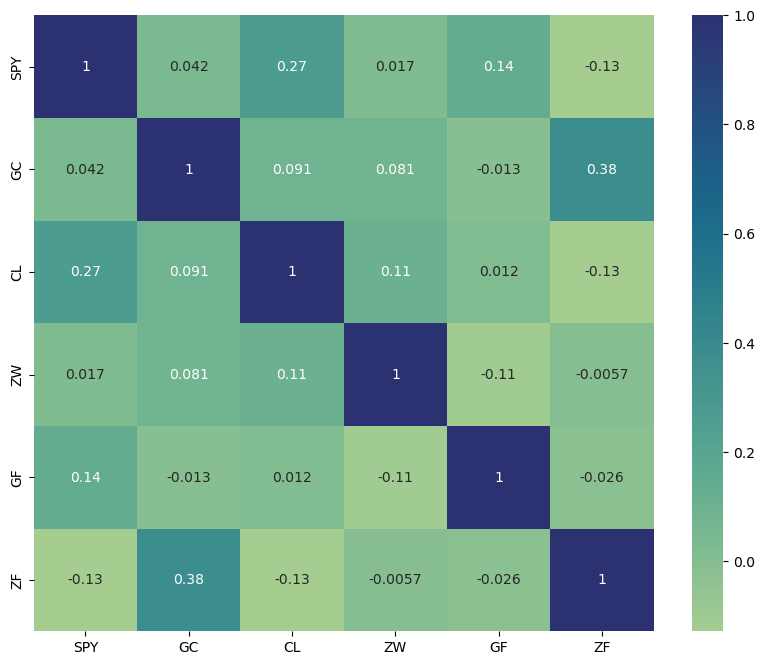

In [15]:
plt.figure(figsize = (10, 8))
sns.heatmap(daily_returns_df.corr(), annot = True, cmap = 'crest');

Assign random weight to the portfolio

In [16]:
def random_portfolio_weights(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
    weights = weights/np.sum(weights)
    return weights

def asset_allocation(df, weights, initial_investment):
    df_copy = df.copy()
    standardized_df = standardized_price(df)
  
    for i, stock in enumerate(standardized_price_df.columns):
        df_copy[stock] = standardized_df[stock] * weights[i] * initial_investment

    df_copy['Portfolio Value [$]'] = df_copy.sum(axis = 1, numeric_only = True)
    df_copy['Portfolio Daily Return [%]'] = df_copy['Portfolio Value [$]'].pct_change(1) * 100 
    df_copy.replace(np.nan, 0, inplace = True)
    
    return df_copy

In [17]:
n = len(portfolio_df.columns)

print('Number of instrument = {}'.format(n))
weights = random_portfolio_weights(n).round(10)
#print(weights.sum())
print('Portfolio weights = {}'.format(weights))

test_df = asset_allocation(portfolio_df, weights, 1000000)
test_df.round(2)

Number of instrument = 6
Portfolio weights = [0.08650949 0.10497112 0.16629113 0.23121975 0.25124452 0.15976399]


,SPY,GC,CL,ZW,GF,ZF,Portfolio Value [$],Portfolio Daily Return [%]
Date,,,,,,,,
2015-01-02,86509.49,104971.12,166291.13,231219.75,251244.52,159763.99,1000000.00,0.00
2015-01-05,84947.17,106153.35,157694.75,234004.33,253938.15,160004.96,996742.70,-0.33
2015-01-06,84147.08,107309.10,150987.68,235496.07,251131.10,160623.11,989694.15,-0.71
2015-01-07,85195.64,106973.85,152939.98,230324.71,250535.67,160570.72,986540.56,-0.32
2015-01-08,86707.43,106594.47,155333.11,225750.04,245602.08,160560.24,980547.37,-0.61
...,...,...,...,...,...,...,...,...
2025-08-25,323951.72,299950.25,203762.52,210733.18,411047.49,146049.58,1595494.75,0.02
2025-08-26,325308.09,303558.69,199700.50,211528.78,413826.18,146290.55,1600212.79,0.30
2025-08-27,326049.33,304467.42,200897.06,208744.20,413570.99,146793.45,1600522.44,0.02


In [18]:
plot_price(test_df[['Portfolio Value [$]']], 'Total Portfolio Value [$]')

In [19]:
rf = 0.03 #risk-free rate
def portfolio_metrics(weights, initial_investment):
    df = asset_allocation(portfolio_df, weights, initial_investment)
    return_on_investment = ((df['Portfolio Value [$]'][-1:] - 
                             df['Portfolio Value [$]'].iloc[0])/ 
                             df['Portfolio Value [$]'].iloc[0]) * 100
  
    daily_return_df = df.drop(columns = ['Portfolio Value [$]', 'Portfolio Daily Return [%]'])
    daily_return_df = daily_return_df.pct_change(1)
    daily_return_df = daily_return_df.fillna(0)
    
    expected_annual_return = np.sum(weights * daily_return_df.mean() ) * 252
    covariance = daily_return_df.cov() * 252 
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))
    sharpe_ratio = (expected_annual_return - rf)/expected_volatility 
    
    return expected_annual_return, expected_volatility, sharpe_ratio, df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]

In [20]:
initial_investment = 1000000
metrics = portfolio_metrics(weights, initial_investment)
print('Expected Portfolio Annual Return = {:.2f}%'.format(metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(metrics[3]))
print('Return on Investment = {:.2f}%'.format(metrics[4]))

Expected Portfolio Annual Return = 6.86%
Portfolio Standard Deviation (Volatility) = 12.35%
Sharpe Ratio = 0.31
Portfolio Final Value = $1610365.91
Return on Investment = 61.04%


Optimal Portfolio Weights and Markowitz Efficient Frontier

In [ ]:
sim_runs = 10000
initial_investment = 1000000

weights_runs = np.zeros((sim_runs, n))
sharpe_ratio_runs = np.zeros(sim_runs)
expected_portfolio_returns_runs = np.zeros(sim_runs)
volatility_runs = np.zeros(sim_runs)
return_on_investment_runs = np.zeros(sim_runs)
final_value_runs = np.zeros(sim_runs)

for i in range(sim_runs):
    weights = random_portfolio_weights(n)
    weights_runs[i,:] = weights

    expected_portfolio_returns_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_value_runs[i], return_on_investment_runs[i] = portfolio_metrics(weights, initial_investment)
    #print("Simulation Run = {}".format(i))   
    #print("Weights = {}, Final Value = ${:.2f}, Sharpe Ratio = {:.2f}".format(weights_runs[i].round(3), final_value_runs[i], sharpe_ratio_runs[i]))   
    #print('\n')

KeyboardInterrupt: 

In [ ]:
optimal_weight = weights_runs[sharpe_ratio_runs.argmax(), :]
optimal_weight

array([0.44249768, 0.4563817 , 0.00616101, 0.00345697, 0.08484253,
       0.00666011])

In [ ]:
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = portfolio_metrics(optimal_weight, initial_investment)

In [ ]:
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 'Portfolio_Return': expected_portfolio_returns_runs.tolist(), 'Sharpe_Ratio': sharpe_ratio_runs.tolist() })
sim_out_df

,Volatility,Portfolio_Return,Sharpe_Ratio
0,0.126677,0.094879,0.512162
1,0.129629,0.103137,0.564198
2,0.113118,0.064576,0.305660
3,0.087946,0.077049,0.534981
4,0.135584,0.086494,0.416669
...,...,...,...
49995,0.086104,0.066736,0.426651
49996,0.128792,0.091404,0.476765
49997,0.135880,0.085521,0.408605
49998,0.123408,0.070210,0.325830


In [ ]:
import plotly.graph_objects as go
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size=sim_out_df['Sharpe_Ratio'].clip(lower=0), hover_data = ['Sharpe_Ratio'] )
fig.add_trace(go.Scatter(x = [optimal_volatility], y = [optimal_portfolio_return], mode = 'markers', name = 'Optimal Point', marker = dict(size=[40], color = 'red')))
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick = 5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

Optimial Portfolio vs SPY

In [ ]:
optimal_df = asset_allocation(portfolio_df, optimal_weight, initial_investment)
plot_price(optimal_df[['Portfolio Value [$]']], 'Optimal Portfolio Value [$]')
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print('  Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return * 100))
print('  Portfolio Standard Deviation = {:.02f}%'.format(optimal_volatility * 100))
print('  Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print('  Portfolio Final Value = ${:.02f}'.format(highest_final_value))
print('  Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

SPY_only_weight = np.array([1, 0, 0, 0, 0, 0])
SPY_only_df = asset_allocation(portfolio_df, SPY_only_weight, initial_investment)
SPY_only_metrics = portfolio_metrics(SPY_only_weight, initial_investment)
plot_price(SPY_only_df[['Portfolio Value [$]']], 'SPY Only Portfolio Value [$]')
print('Portfolio Metrics if all initial investment is invested in SPY'.format(sim_runs))
print('  Portfolio Expected Annual Return = {:.02f}%'.format(SPY_only_metrics[0] * 100))
print('  Portfolio Standard Deviation = {:.02f}%'.format(SPY_only_metrics[1] * 100))
print('  Sharpe Ratio = {:.02f}'.format(SPY_only_metrics[2]))
print('  Portfolio Final Value = ${:.02f}'.format(SPY_only_metrics[3]))
print('  Return on Investment = {:.02f}%'.format(SPY_only_metrics[4]))

Best Portfolio Metrics Based on 50000 Monte Carlo Simulation Runs:
  Portfolio Expected Annual Return = 12.05%
  Portfolio Standard Deviation = 11.08%
  Sharpe Ratio = 0.82
  Portfolio Final Value = $3169005.75
  Return on Investment = 216.90%


Portfolio Metrics if all initial investment is invested in SPY
  Portfolio Expected Annual Return = 14.07%
  Portfolio Standard Deviation = 17.95%
  Sharpe Ratio = 0.62
  Portfolio Final Value = $3759733.83
  Return on Investment = 275.97%
